In [2]:
import numpy as np
import pandas as pd
import datetime as dt


###  Special focus should be put on the CZxDE relationship and correlations with NL, DE, and UK

In [3]:
# Generation of time series Test_df

start_time = '2020-06-01 00:00:00.00'
end_time = '2022-06-01 00:00:00.00'
start_times = pd.date_range(start= pd.Timestamp(start_time).round('60T'), end = pd.Timestamp(end_time).round('60T'), freq="60T")
end_times = start_times + pd.Timedelta('60T')
start_times_list = start_times.strftime('%Y-%m-%d %H:%M:%S').tolist()

multi_timeseries_df=pd.DataFrame()
multi_timeseries_df['datetime']=start_times_list

multi_timeseries_df['Year']=pd.DatetimeIndex(multi_timeseries_df['datetime']).year
multi_timeseries_df['Month']=pd.DatetimeIndex(multi_timeseries_df['datetime']).month
multi_timeseries_df['Day']=pd.DatetimeIndex(multi_timeseries_df['datetime']).day
multi_timeseries_df['Hour']=pd.DatetimeIndex(multi_timeseries_df['datetime']).hour

multi_timeseries_df.set_index("datetime", inplace=True)
multi_timeseries_df.index= pd.to_datetime(multi_timeseries_df.index)

for col in ['NL',  'AT', 'DE','FR','UK']:
    multi_timeseries_df[col] = np.round((multi_timeseries_df.Day/5) *np.random.normal(-20,1000, multi_timeseries_df.shape[0])+(multi_timeseries_df.Month *np.random.standard_cauchy(multi_timeseries_df.shape[0])[0]),2)
multi_timeseries_df['BE']=multi_timeseries_df['NL']/2+multi_timeseries_df['DE']/3 #adding some column corrolations
multi_timeseries_df['CZ']=multi_timeseries_df['BE']/2+multi_timeseries_df['DE']/3
multi_timeseries_df['AT']=multi_timeseries_df['AT']/2+multi_timeseries_df['DE']/2
multi_timeseries_df['FR']=multi_timeseries_df['FR']/2+multi_timeseries_df['DE']/2
multi_timeseries_df['UK']=multi_timeseries_df['UK']/2+multi_timeseries_df['FR']/2
multi_timeseries_df.head(3)

,Year,Month,Day,Hour,NL,AT,DE,FR,UK,BE,CZ
datetime,,,,,,,,,,,
2020-06-01 00:00:00,2020,6,1,0,25.13,-173.220,-221.19,17.995,-138.4525,-61.165000,-104.3125
2020-06-01 01:00:00,2020,6,1,1,129.19,-101.640,-179.86,23.910,199.0800,4.641667,-57.6325
2020-06-01 02:00:00,2020,6,1,2,252.99,-268.245,-366.80,-37.920,-258.0650,4.228333,-120.1525


## Nonparametric Statistical Hypothesis Tests

In [4]:
from numpy import mean
from numpy import std

data1 = multi_timeseries_df['CZ']
data2 = multi_timeseries_df['DE']
data3 = multi_timeseries_df['NL']
data4 = multi_timeseries_df['UK']
# summarize
print('CZ: mean=%.3f stdv=%.3f' % (mean(data1), std(data1)))
print('DE: mean=%.3f stdv=%.3f' % (mean(data2), std(data2)))
print('NL: mean=%.3f stdv=%.3f' % (mean(data3), std(data3)))
print('UK: mean=%.3f stdv=%.3f' % (mean(data4), std(data4)))

CZ: mean=-30.964 stdv=1997.033
DE: mean=-10.687 stdv=3597.536
NL: mean=-102.480 stdv=3564.023
UK: mean=-40.671 stdv=2182.479


The p-value strongly suggests that the sample distributions are different, as is expected.

### 1-  Mann-Whitney U Test

In [5]:
from scipy.stats import mannwhitneyu
# compare samples
stat, p = mannwhitneyu(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
alpha = 0.05
if p > alpha:
    print('Same distribution (fail to reject H0)')
else:
    print('Different distribution (reject H0)')

Statistics=152683099.500, p=0.393
Same distribution (fail to reject H0)


### 2-  Wilcoxon Signed-Rank Test

In [6]:
from scipy.stats import wilcoxon
# compare samples
stat, p = wilcoxon(data1, data2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
	print('Same distribution (fail to reject H0)')
else:
	print('Different distribution (reject H0)')

Statistics=76190677.000, p=0.403
Same distribution (fail to reject H0)


### 3-Kruskal-Wallis H Test

In [7]:
from scipy.stats import kruskal
stat, p = kruskal(data1, data2)
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
	print('Probably the same distribution')
else:
	print('Probably different distributions')

stat=0.731, p=0.393
Probably the same distribution


# Distribution approximation

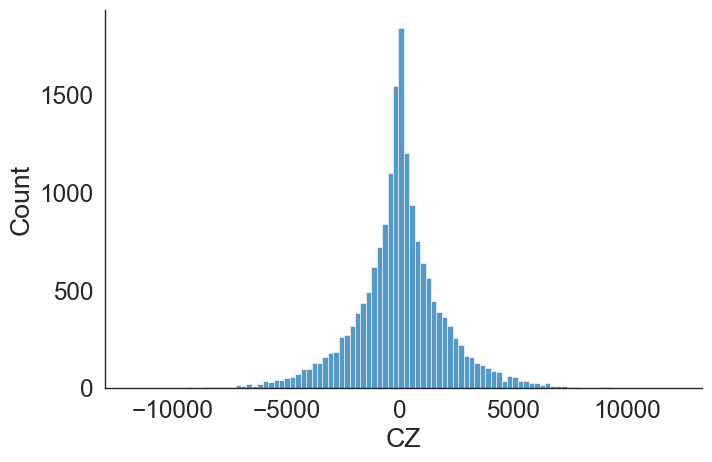

In [10]:
import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
sns.displot(data=data1, kind="hist", bins = 100, aspect = 1.5)

,sumsquare_error,aic,bic,kl_div
beta,4.305902e-08,2793.851255,-468329.650223,inf
norm,4.305926e-08,2789.853731,-468349.095592,inf
lognorm,4.306843e-08,2796.560493,-468335.594011,inf
gamma,4.313689e-08,2792.353782,-468307.765281,inf
burr,2.105687e-07,2298.525768,-440519.616991,inf


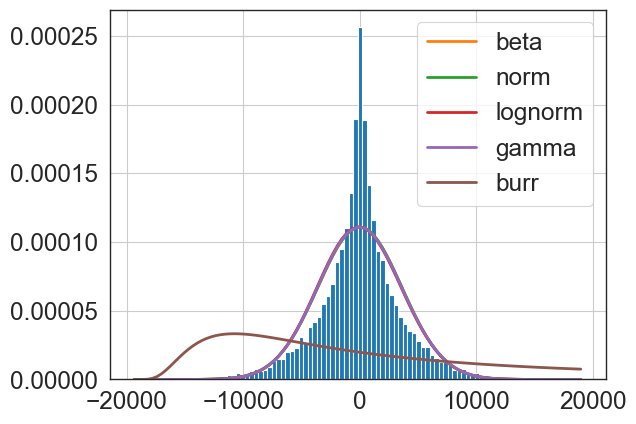

In [9]:
f = Fitter(data2,
           distributions=['gamma','lognorm',"beta","burr","norm"])
f.fit()
f.summary()

In [11]:
f.get_best(method = 'sumsquare_error')

{'beta': {'a': 2132838.574614103,
  'b': 1788421.3126129515,
  'loc': -7779676.819932049,
  'scale': 14303047.948350167}}

We can also print the fitted parameters of lognorm using the fitted_param attribute and indexing it out using the distribution name

In [12]:
get_distributions()

['alpha',
 'anglit',
 'arcsine',
 'argus',
 'beta',
 'betaprime',
 'bradford',
 'burr',
 'burr12',
 'cauchy',
 'chi',
 'chi2',
 'cosine',
 'crystalball',
 'dgamma',
 'dweibull',
 'erlang',
 'expon',
 'exponnorm',
 'exponpow',
 'exponweib',
 'f',
 'fatiguelife',
 'fisk',
 'foldcauchy',
 'foldnorm',
 'gamma',
 'gausshyper',
 'genexpon',
 'genextreme',
 'gengamma',
 'genhalflogistic',
 'genhyperbolic',
 'geninvgauss',
 'genlogistic',
 'gennorm',
 'genpareto',
 'gilbrat',
 'gompertz',
 'gumbel_l',
 'gumbel_r',
 'halfcauchy',
 'halfgennorm',
 'halflogistic',
 'halfnorm',
 'hypsecant',
 'invgamma',
 'invgauss',
 'invweibull',
 'johnsonsb',
 'johnsonsu',
 'kappa3',
 'kappa4',
 'ksone',
 'kstwo',
 'kstwobign',
 'laplace',
 'laplace_asymmetric',
 'levy',
 'levy_l',
 'levy_stable',
 'loggamma',
 'logistic',
 'loglaplace',
 'lognorm',
 'loguniform',
 'lomax',
 'maxwell',
 'mielke',
 'moyal',
 'nakagami',
 'ncf',
 'nct',
 'ncx2',
 'norm',
 'norminvgauss',
 'pareto',
 'pearson3',
 'powerlaw',
 'pow

In [13]:
get_common_distributions()

['cauchy',
 'chi2',
 'expon',
 'exponpow',
 'gamma',
 'lognorm',
 'norm',
 'powerlaw',
 'rayleigh',
 'uniform']

,sumsquare_error,aic,bic,kl_div
cauchy,5.484382e-09,2390.445569,-504454.144145,inf
norm,3.606828e-08,2984.406516,-471453.175377,inf
gamma,3.613510e-08,2997.122651,-471410.975387,inf
rayleigh,7.639824e-08,inf,-458302.863689,inf
powerlaw,1.921725e-07,2154.586817,-442131.133479,inf


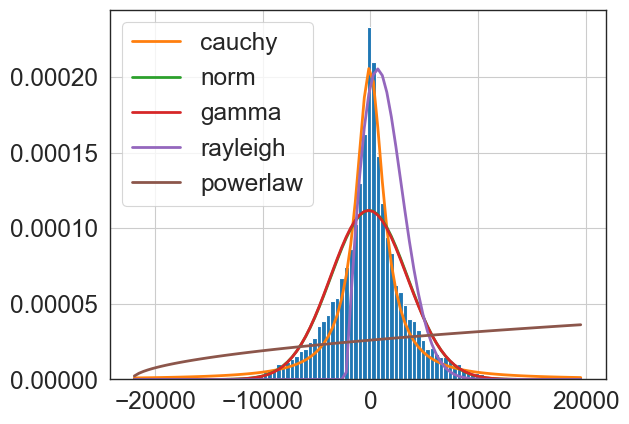

In [14]:
f1 = Fitter(data3,distributions= get_common_distributions())
f1.fit()
f1.summary()

In [15]:
f1.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': -52.07959134986729, 'scale': 1542.313788624587}}

,sumsquare_error,aic,bic,kl_div
cauchy,7.544492e-09,2362.701088,-498866.465308,inf
norm,4.305926e-08,2789.853731,-468349.095592,inf
lognorm,4.306843e-08,2796.560493,-468335.594011,inf
gamma,4.313689e-08,2792.353782,-468307.765281,inf
rayleigh,7.275392e-08,inf,-459159.236278,inf


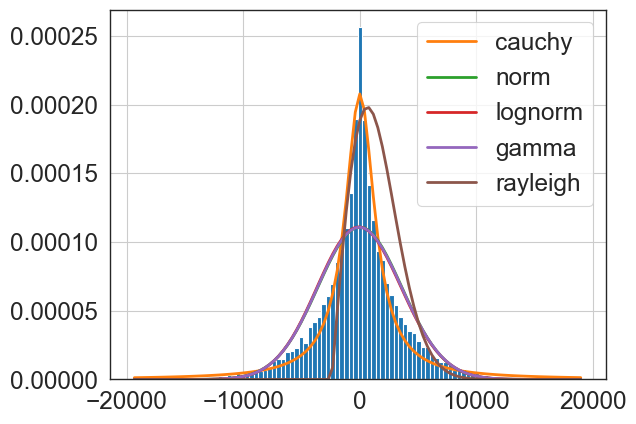

In [16]:
f2 = Fitter(data2,distributions= get_common_distributions())
f2.fit()
f2.summary()

In [17]:
f2.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': -1.0228675989081935, 'scale': 1532.5322310540437}}

,sumsquare_error,aic,bic,kl_div
cauchy,5.484382e-09,2390.445569,-504454.144145,inf
norm,3.606828e-08,2984.406516,-471453.175377,inf
gamma,3.613510e-08,2997.122651,-471410.975387,inf
rayleigh,7.639824e-08,inf,-458302.863689,inf
powerlaw,1.921725e-07,2154.586817,-442131.133479,inf


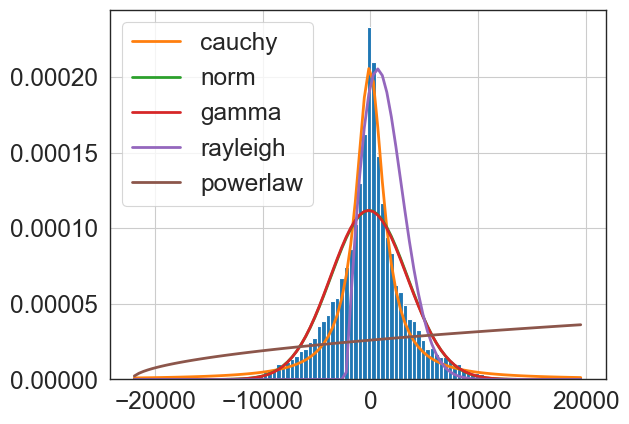

In [18]:
f3 = Fitter(data3,
           distributions= get_common_distributions())
f3.fit()
f3.summary()

In [19]:
f3.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': -52.07959134986729, 'scale': 1542.313788624587}}

,sumsquare_error,aic,bic,kl_div
cauchy,1.866694e-08,2249.010376,-482993.557722,inf
norm,1.171193e-07,2626.338240,-450817.306639,inf
gamma,1.172632e-07,2633.116997,-450786.024401,inf
rayleigh,1.252078e-07,inf,-449647.228335,inf
chi2,1.254412e-07,2685.436304,-449604.824957,inf


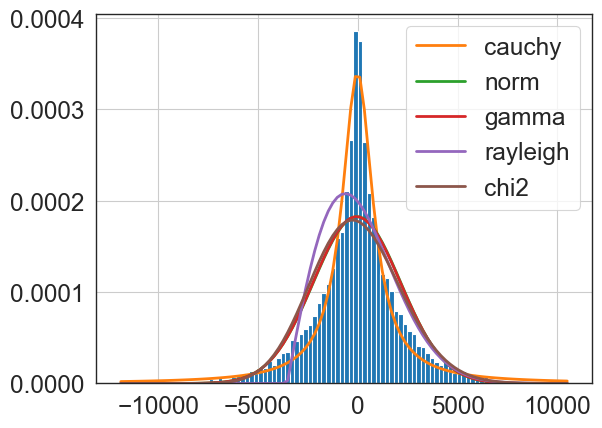

In [20]:
f4 = Fitter(data4,
           distributions= get_common_distributions())
f4.fit()
f4.summary()

In [21]:
f4.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': -17.40662631298275, 'scale': 934.2867306105061}}

The Cauchy distribution, sometimes called the Lorentz distribution, is a family of continuous probably distributions which resemble the normal distribution family of curves. While the resemblance is there, it has a taller peak than a normal and it's fat tails decay much more slowly:


When would you use a Cauchy distribution?

The Cauchy distribution has been used in many applications such as mechanical and electrical theory, physical anthropology, measurement problems, risk and financial analysis. I

#### Are the distributions of power prices between the regions at hour 1 across all Januarys in the data set the same?

In [23]:
df11 = multi_timeseries_df[multi_timeseries_df['Hour']==1]
Jan = df11[df11['Month']==1]
Feb = df11[df11['Month']==2]
Mar = df11[df11['Month']==3]

In [24]:
import plotly.express as px
fig = px.line(df11[['DE','Month']], x=df11.index, y="DE", color='Month')
fig.show()

,sumsquare_error,aic,bic,kl_div
cauchy,3.518916e-08,2205.698910,-17328.381730,inf
rayleigh,7.371585e-08,inf,-16788.561498,inf
norm,8.168098e-08,2268.595452,-16713.661055,inf
lognorm,8.203449e-08,2276.412343,-16703.915379,inf
gamma,8.398970e-08,2286.030393,-16686.720711,inf


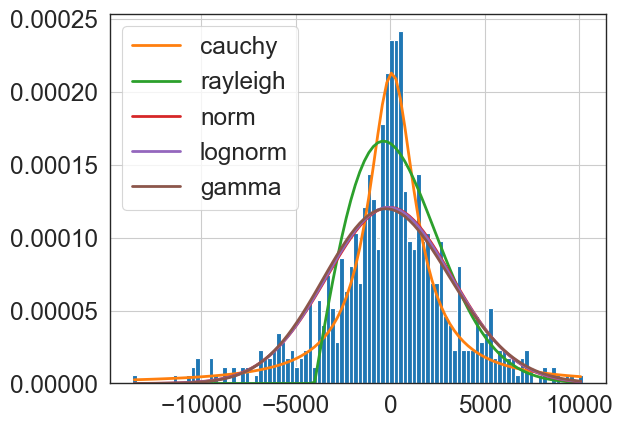

In [25]:
f5 = Fitter(df11['DE'],
           distributions= get_common_distributions())
f5.fit()
f5.summary()

In [26]:
f5.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': 76.33029331031173, 'scale': 1495.7928059073288}}

,sumsquare_error,aic,bic,kl_div
cauchy,5.175310e-07,2089.069647,-1145.028245,inf
norm,5.811628e-07,2031.870822,-1137.838630,inf
gamma,5.811971e-07,2033.652427,-1133.707829,inf
rayleigh,6.985087e-07,1986.298193,-1126.435788,inf
powerlaw,8.196410e-07,1948.856129,-1112.393690,inf


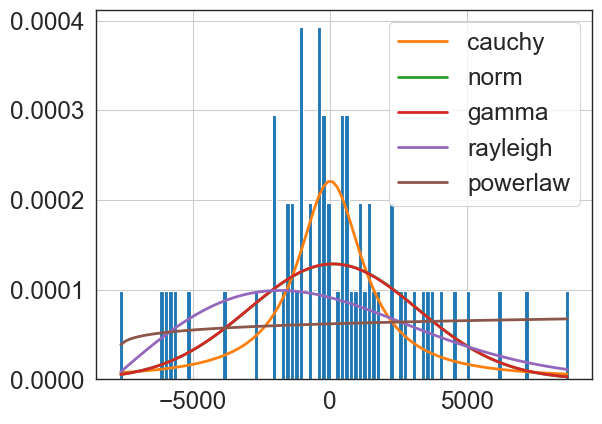

In [27]:
JanDE = Fitter(Jan['DE'],
           distributions= get_common_distributions())
JanDE.fit()
JanDE.summary()

In [28]:
JanDE.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': 20.66841670364863, 'scale': 1438.803028022563}}

,sumsquare_error,aic,bic,kl_div
cauchy,0.000002,1954.104545,-1074.906281,inf
rayleigh,0.000002,inf,-1069.320614,inf
norm,0.000002,1900.404688,-1069.011590,inf
gamma,0.000002,1901.286243,-1064.499561,inf
powerlaw,0.000003,1822.396693,-1041.958323,inf


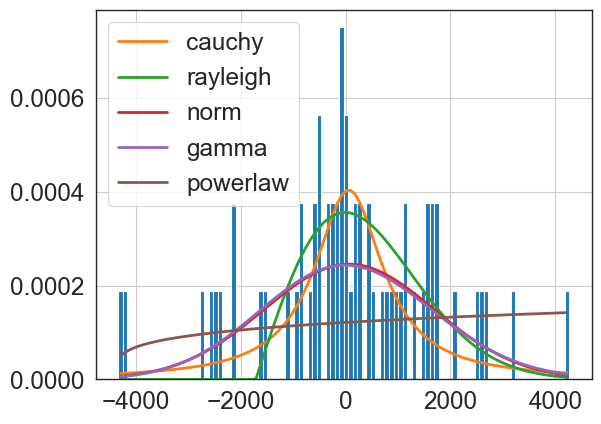

In [29]:
JanCz = Fitter(Jan['CZ'],
           distributions= get_common_distributions())
JanCz.fit()
JanCz.summary()

In [30]:
JanCz.get_best(method = 'sumsquare_error')

{'cauchy': {'loc': 62.008307855597934, 'scale': 787.8812867067423}}

In [31]:
df1=multi_timeseries_df[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK']]

In [32]:
corr = df1.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\S61191\AppData\Local\Temp/ipykernel_22412/401508114.py:2: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,NL,BE,AT,DE,FR,CZ,UK
NL,1.00,0.83,-0.00,-0.01,-0.01,0.43,-0.01
BE,0.83,1.00,0.39,0.55,0.38,0.87,0.22
AT,-0.00,0.39,1.00,0.70,0.50,0.63,0.28
DE,-0.01,0.55,0.70,1.00,0.70,0.89,0.41
FR,-0.01,0.38,0.50,0.70,1.00,0.63,0.56
CZ,0.43,0.87,0.63,0.89,0.63,1.00,0.36
UK,-0.01,0.22,0.28,0.41,0.56,0.36,1.00


In [33]:
df1=df1.reset_index(drop=True)

 Scatter compactly plots all the numeric variables we have in a dataset against each other one. 
plot a density plot instead of a histogram

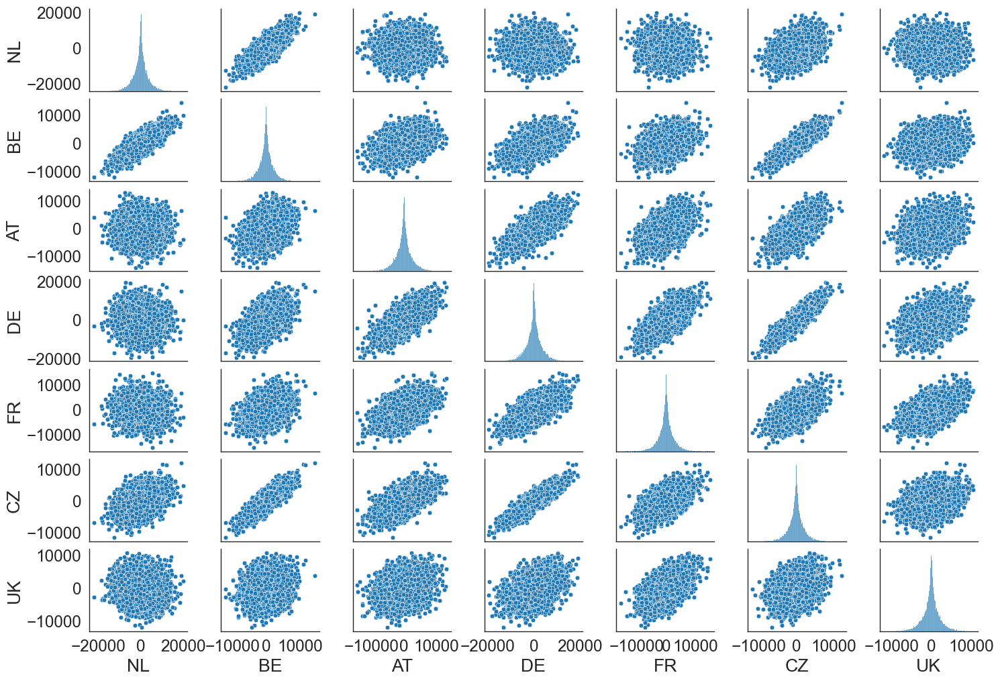

In [34]:
# Plotting Scatter Matrix
# just numeric excluding latitude and city
g=sns.pairplot(data=df1);
g.fig.set_size_inches(15,10)

In [35]:
df=multi_timeseries_df.copy()

In [36]:
from datetime import date, datetime

Y = 2000 # dummy leap year to allow input X-02-29 (leap day)
seasons = [('winter', (date(Y,  1,  1),  date(Y,  3, 20))),
           ('spring', (date(Y,  3, 21),  date(Y,  6, 20))),
           ('summer', (date(Y,  6, 21),  date(Y,  9, 22))),
           ('winter', (date(Y,  9, 23),  date(Y, 12, 31)))]

def get_season(now):
    if isinstance(now, datetime):
        now = now.date()
    now = now.replace(year=Y)
    return next(season for season, (start, end) in seasons
                if start <= now <= end)

from sys import stdout


def get_part_of_day(hour):
    return (
        "morning" if 5 <= hour <= 11 #9-20 WEEKDAYS peak
        else
        "afternoon" if 12 <= hour <= 17
        else
        "evening" if 18 <= hour <= 22
        else
        "night"
    )

def get_peak(hour):
    return (
        "On Peak" if 8 <= hour <= 20 #8-20 WEEKDAYS peak
        else
        "Off Peak"
    )

def get_weekday(date):
    return (
        True if date.split(',')[0] in ['Friday', 'Monday', 'Thursday', 'Tuesday', 'Wednesday']
    else
        False
    )

In [37]:
df['season']=[get_season(i) for i in df.index ]
df['part_of_day']=[get_part_of_day(i) for i in df['Hour'] ]
df['get_peak']=[get_peak(i) for i in df['Hour'] ]

#df['weekday']=[get_weekday(i) for i in df['Date'] ]

In [38]:
df3=df[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK','part_of_day','season']]
df3=df3.reset_index(drop=True)
spring=df3[df3['season']=='spring'][['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK','part_of_day']]
winter=df3[df3['season']=='winter'][['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK','part_of_day']]

In [39]:
df1=df[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK','part_of_day']]
df1=df1.reset_index(drop=True)

Text(0.5, 0.98, 'After 03.2022')

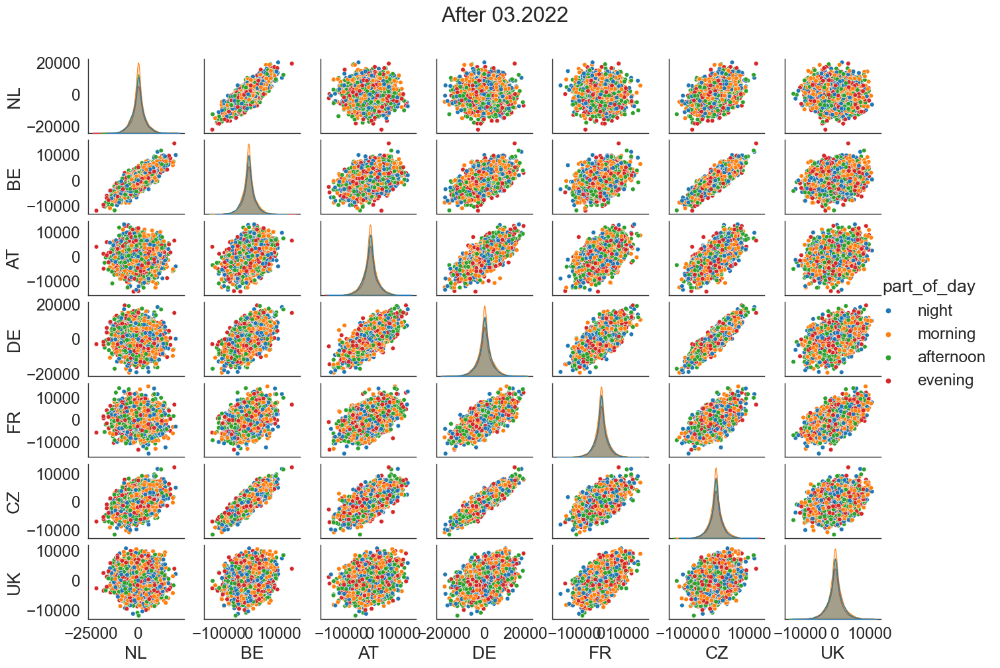

In [40]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df1, hue="part_of_day",diag_kind="kde");
g.fig.set_size_inches(15,10)
g.fig.subplots_adjust(top=0.9) 
g.fig.suptitle('After 03.2022')


Text(0.5, 0.98, 'Winter After 03.2022')

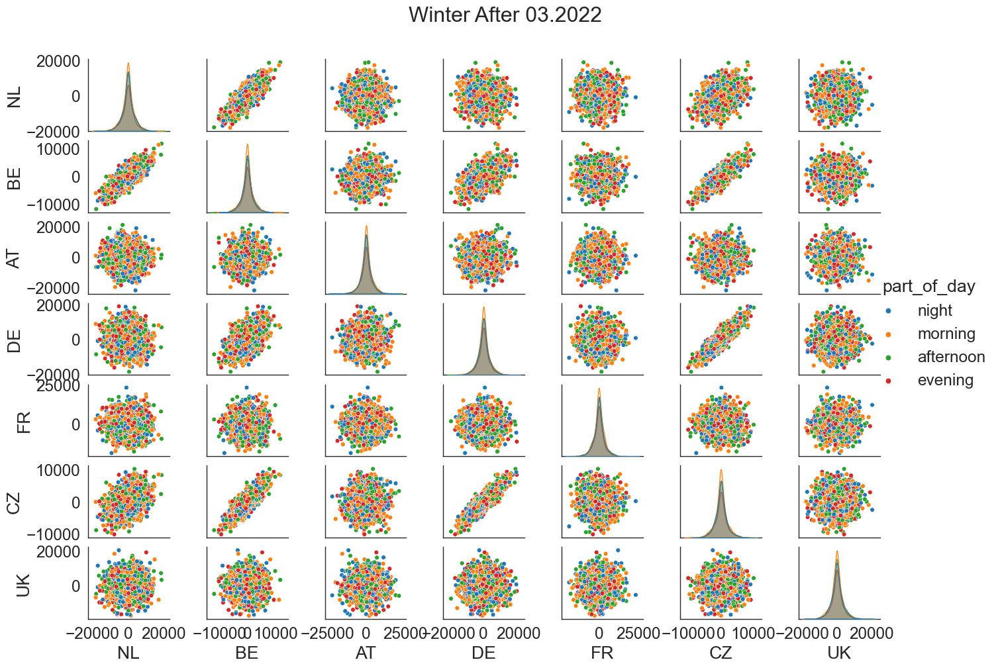

In [465]:
# Plotting Scatter Matrix
g=sns.pairplot(data=winter, hue="part_of_day",diag_kind="kde");
g.fig.set_size_inches(15,10)
g.fig.subplots_adjust(top=0.9) 
g.fig.suptitle('Winter')

In [41]:
df2=df[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK','get_peak']]
df2=df2.reset_index(drop=True)

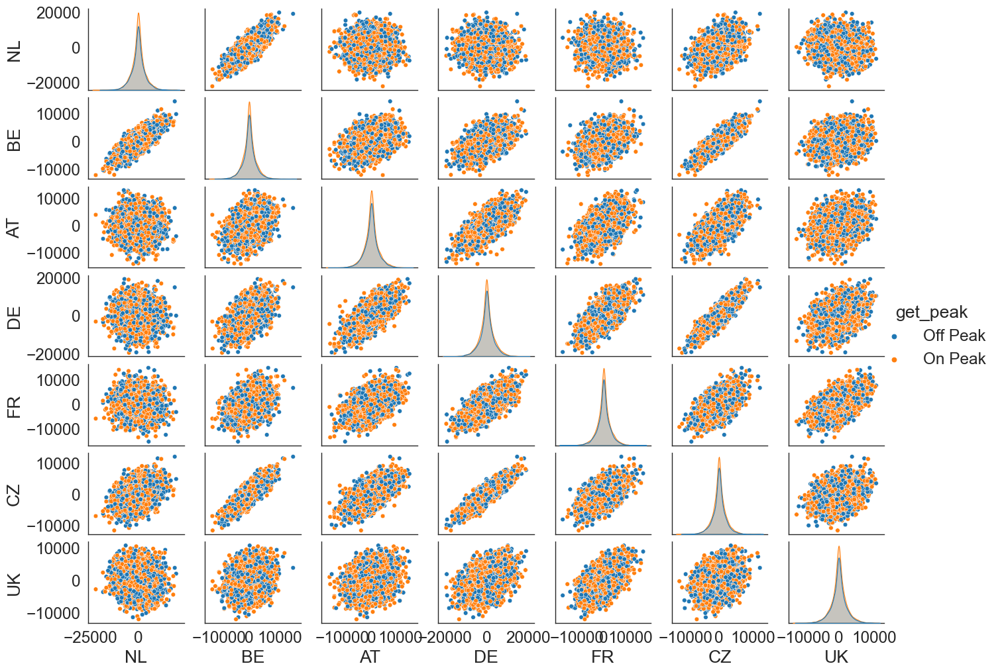

In [42]:
# Plotting Scatter Matrix of peak hours
g=sns.pairplot(data=df2, hue="get_peak",diag_kind="kde");
g.fig.set_size_inches(15,10)

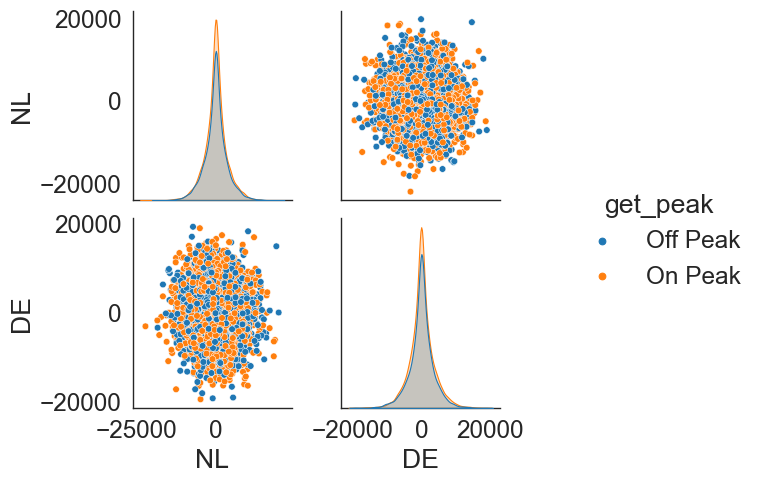

In [46]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df2[['NL','DE','get_peak']], hue="get_peak",diag_kind="kde");
g.fig.set_size_inches(8,5)

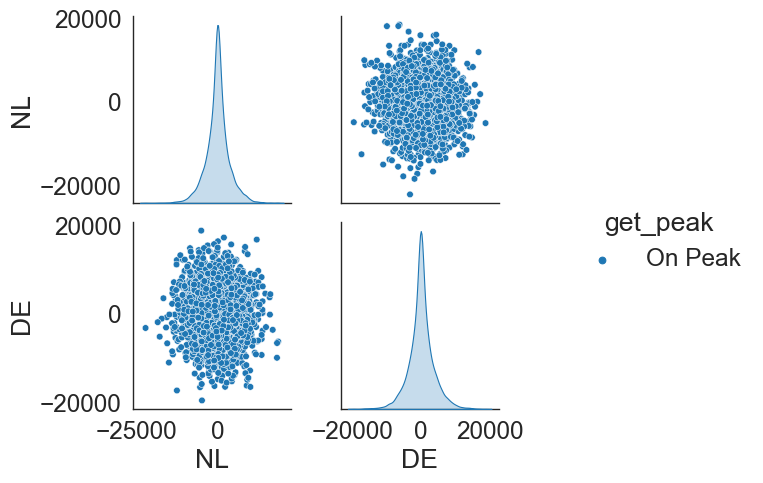

In [47]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df2[['NL','DE','get_peak']][df2[['NL','DE','get_peak']]["get_peak"]=="On Peak"], hue="get_peak",diag_kind="kde");
g.fig.set_size_inches(8,5)

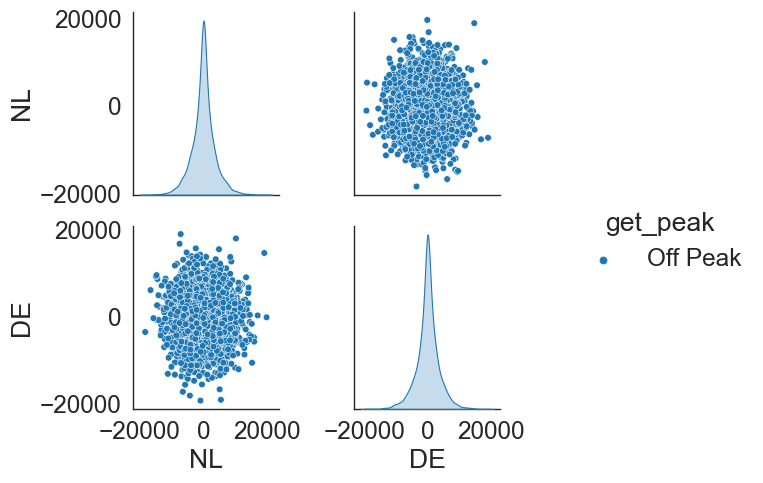

In [48]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df2[['NL','DE','get_peak']][df2[['NL','DE','get_peak']]["get_peak"]=="Off Peak"], hue="get_peak",diag_kind="kde");
g.fig.set_size_inches(8,5)

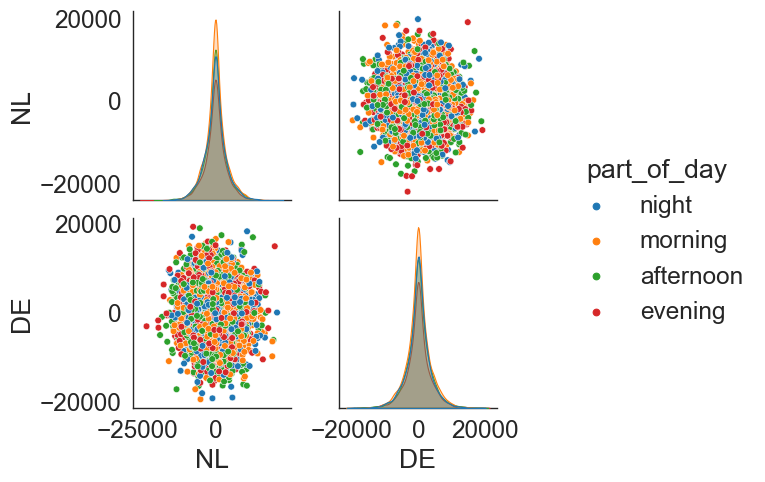

In [49]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df1[['NL','DE','part_of_day']], hue="part_of_day",diag_kind="kde");
g.fig.set_size_inches(8,5)

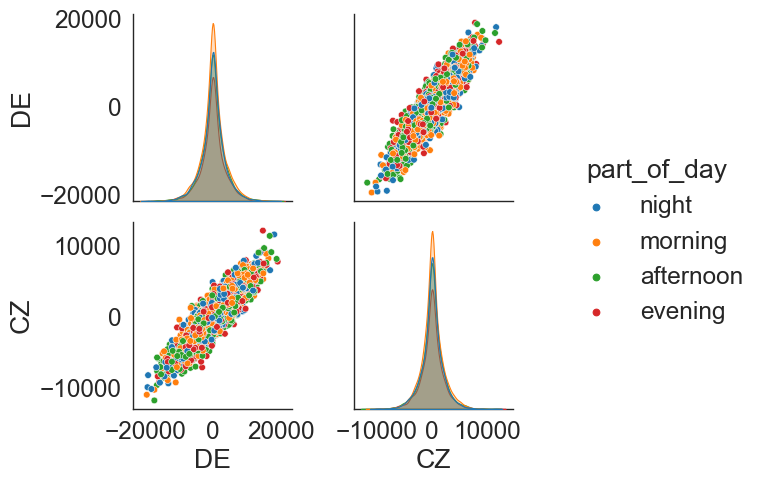

In [50]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df1[['DE','CZ','part_of_day']], hue="part_of_day",diag_kind="kde");
g.fig.set_size_inches(8,5)

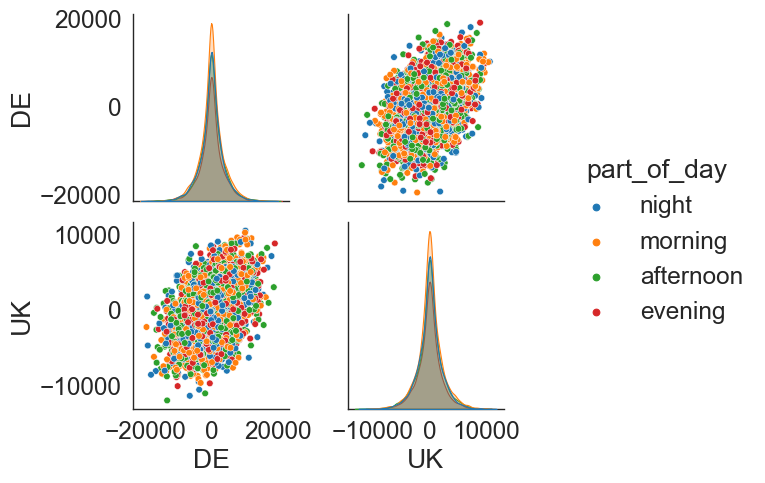

In [51]:
# Plotting Scatter Matrix
g=sns.pairplot(data=df1[['DE','UK','part_of_day']], hue="part_of_day",diag_kind="kde");
g.fig.set_size_inches(8,5)

Correlation between DE and NL ==>  -0.01289024612665597


<Figure size 400x300 with 0 Axes>

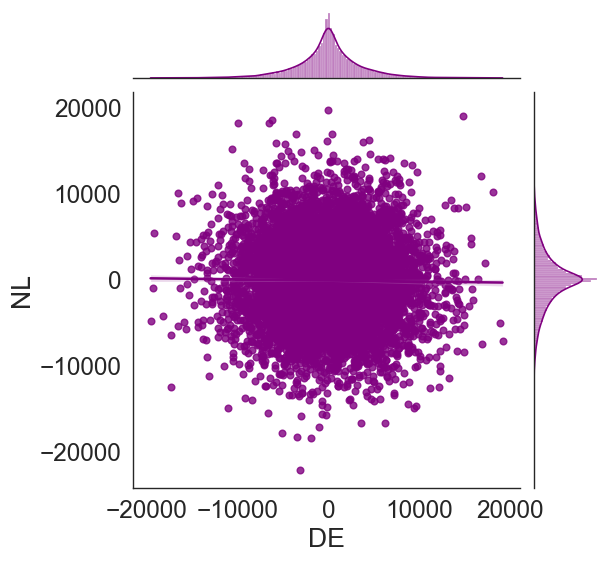

Correlation between DE and BE ==>  0.5509003769008675


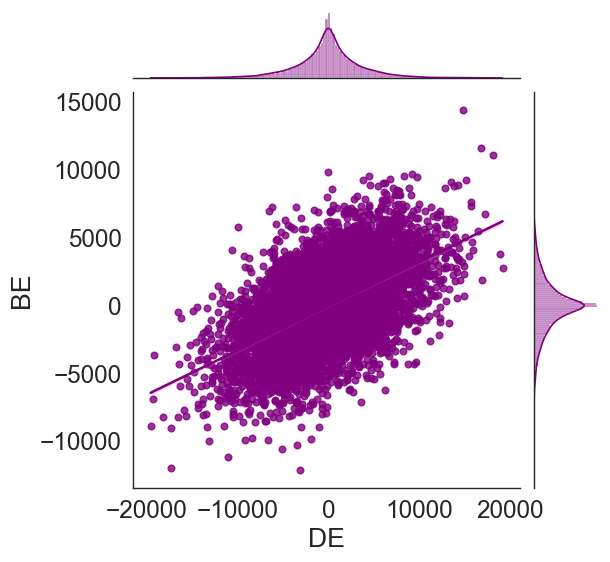

Correlation between DE and AT ==>  0.7049302794976657


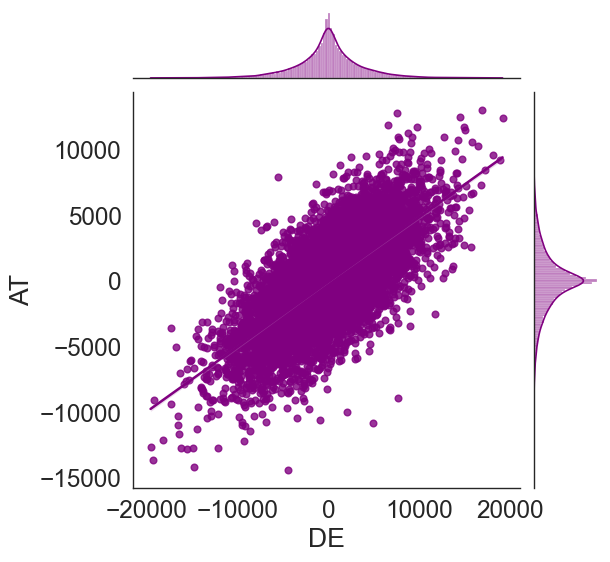

Correlation between DE and FR ==>  0.7043618960774803


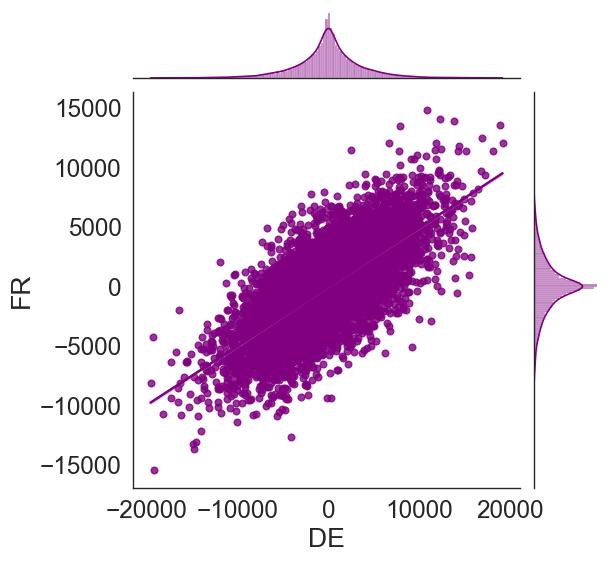

Correlation between DE and CZ ==>  0.8949692753086862


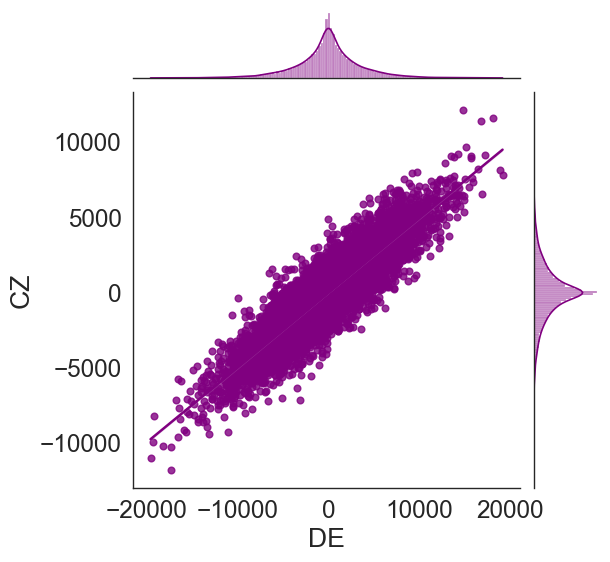

Correlation between DE and UK ==>  0.4091525602623983


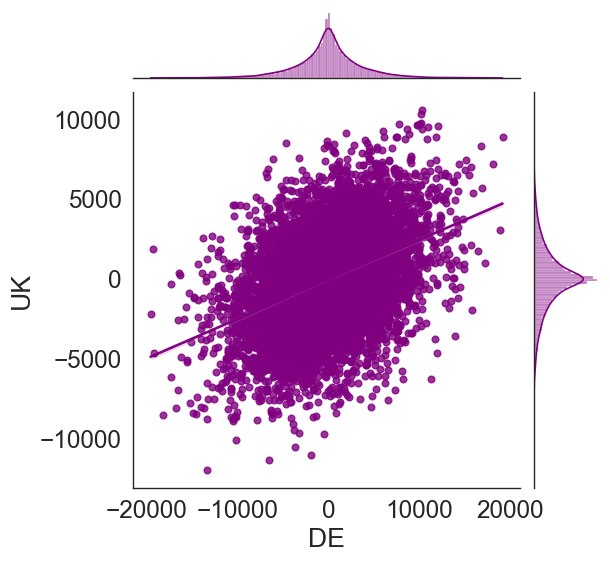

In [52]:
import matplotlib.pyplot as plt
plt.figure(dpi = 100, figsize = (4,3))
for i in  df2.columns:
    if i != 'get_peak' and i != 'DE':
        print(f"Correlation between DE and {i} ==> ",df2.corr().loc['DE'][i])
        sns.jointplot(x='DE',y=i,data=df2,kind = 'reg',color = 'purple')
        plt.show()

Correlation between DE and NL ==>  -0.01289024612665597


<Figure size 500x400 with 0 Axes>

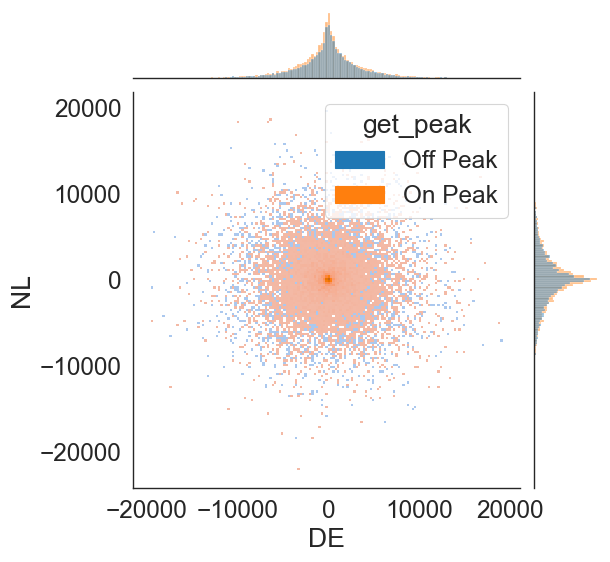

Correlation between DE and BE ==>  0.5509003769008675


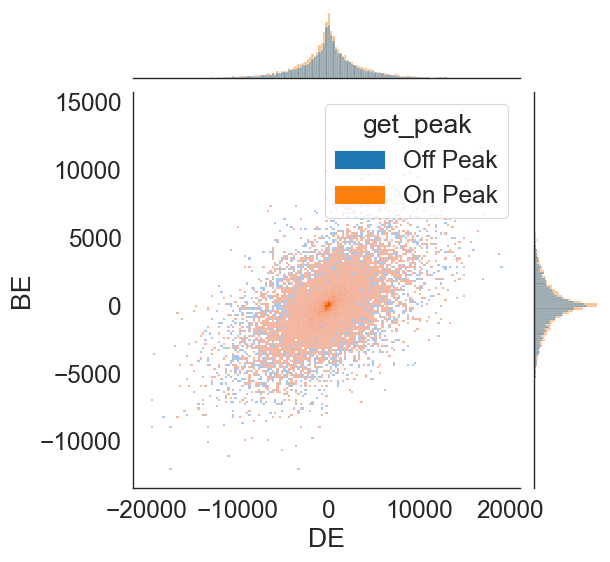

Correlation between DE and AT ==>  0.7049302794976657


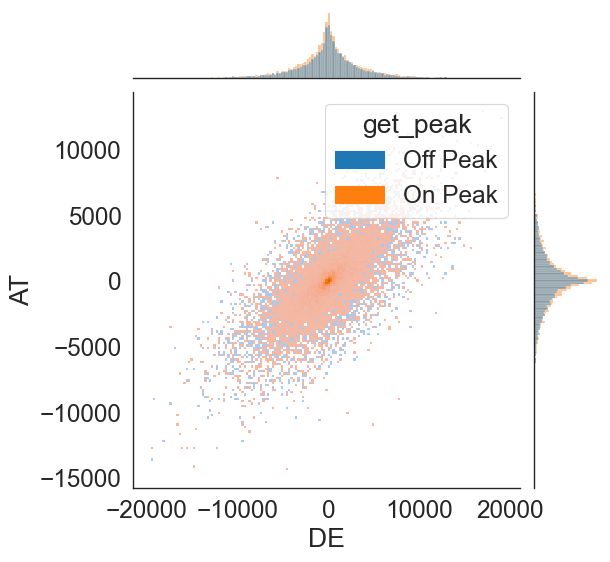

Correlation between DE and FR ==>  0.7043618960774803


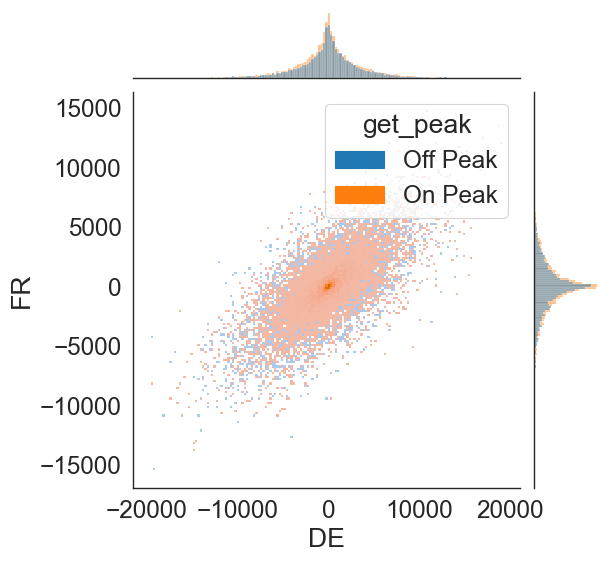

Correlation between DE and CZ ==>  0.8949692753086862


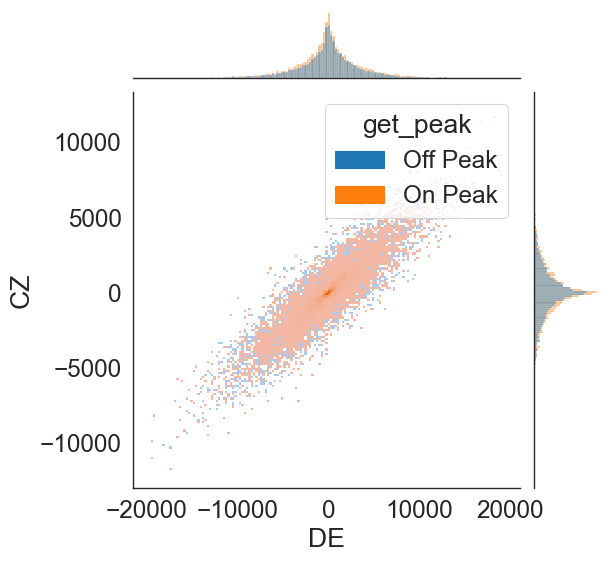

Correlation between DE and UK ==>  0.4091525602623983


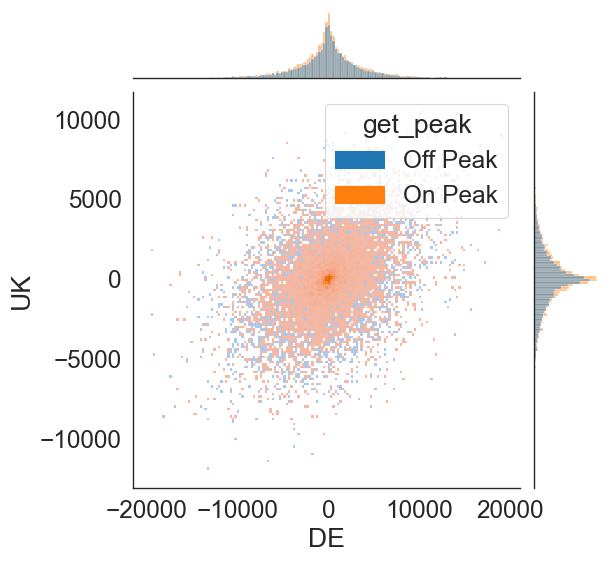

In [53]:
import matplotlib.pyplot as plt
plt.figure(dpi = 100, figsize = (5,4))
for i in  df2.columns:
    if i != 'get_peak' and i != 'DE':
        print(f"Correlation between DE and {i} ==> ",df2.corr().loc['DE'][i])
        sns.jointplot(x='DE',hue="get_peak",y=i,data=df2,kind = 'hist',color = 'purple')
        plt.show()

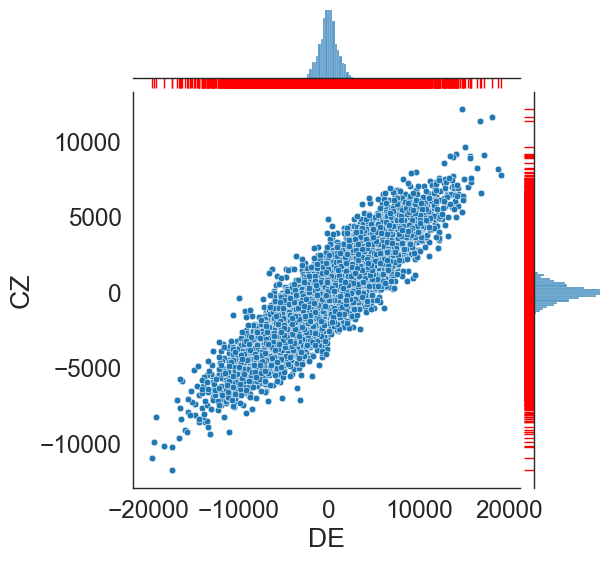

In [54]:
g = sns.jointplot(data=df2, x="DE", y="CZ")
g.plot_joint(sns.kdeplot, color="r", zorder=0, levels=6)
g.plot_marginals(sns.rugplot, color="r", height=-.15, clip_on=False)

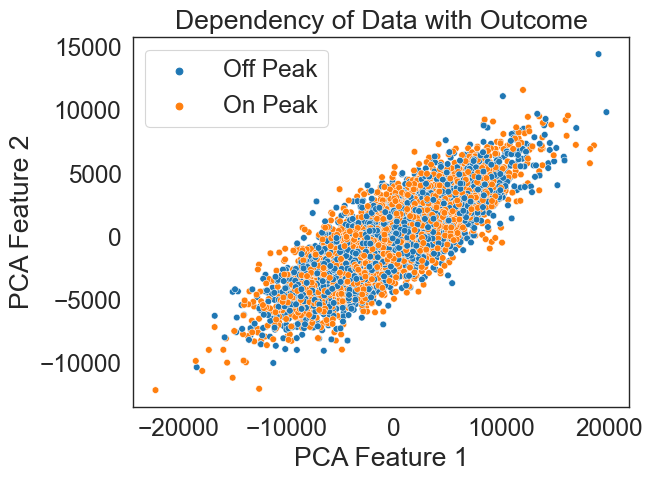

In [55]:
x= df2.iloc[:,:-1].values
y= df2.iloc[:,-1].values

from sklearn.decomposition import PCA
pca = PCA(n_components=2)
pca.fit(x)

x_new = pca.transform(x)

xs = x[:,0]
ys = x[:,1]

plt.figure(dpi=100)
sns.scatterplot(x=xs,y=ys,hue=y).set_title('Dependency of Data with Outcome')
plt.xlabel('PCA Feature 1')
plt.ylabel('PCA Feature 2')
plt.show()

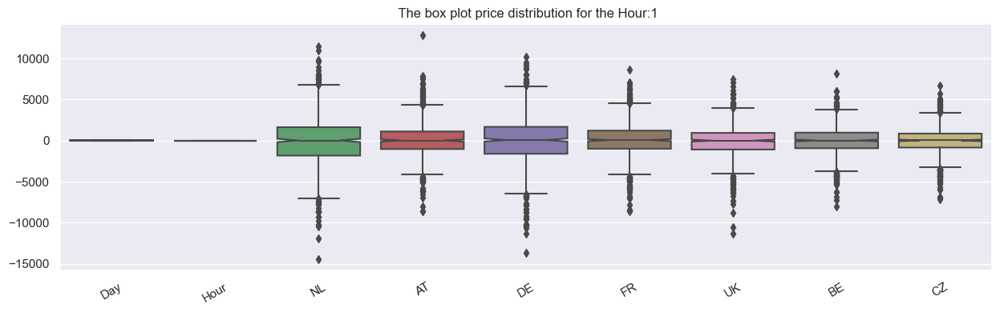

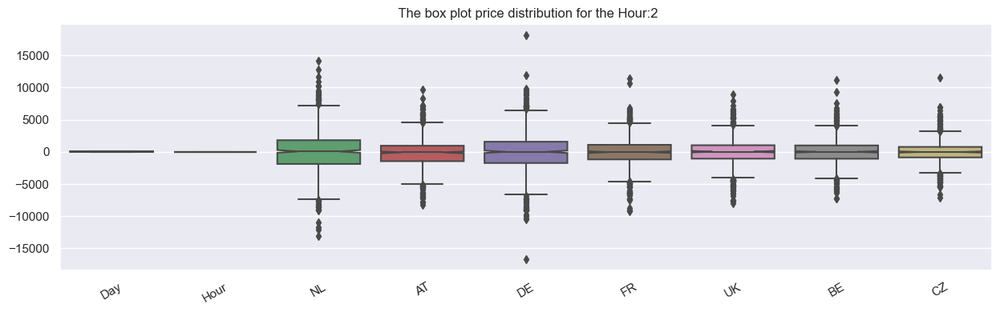

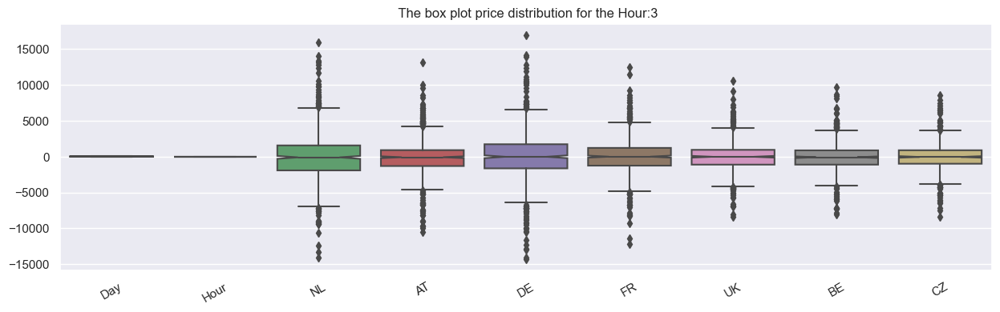

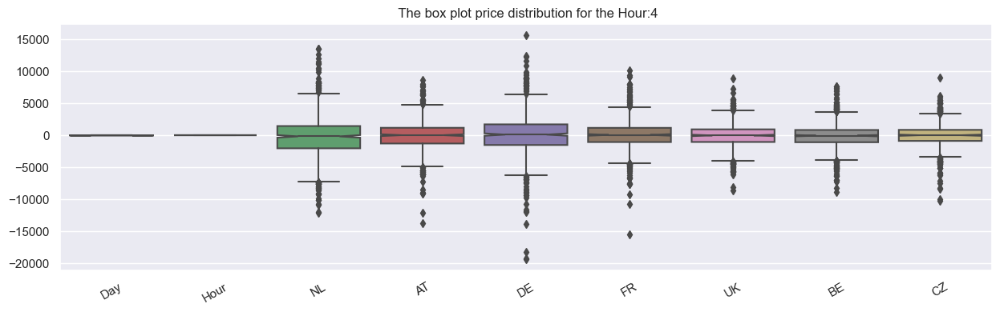

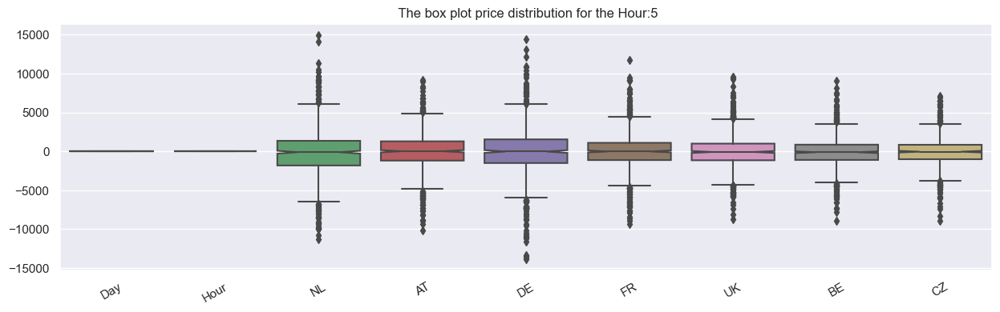

...

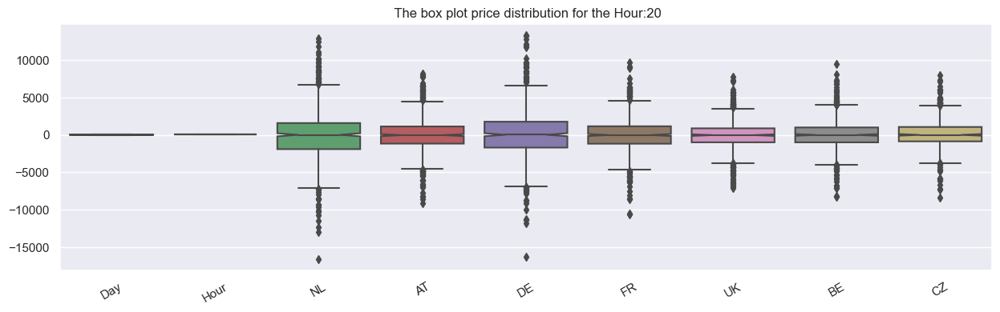

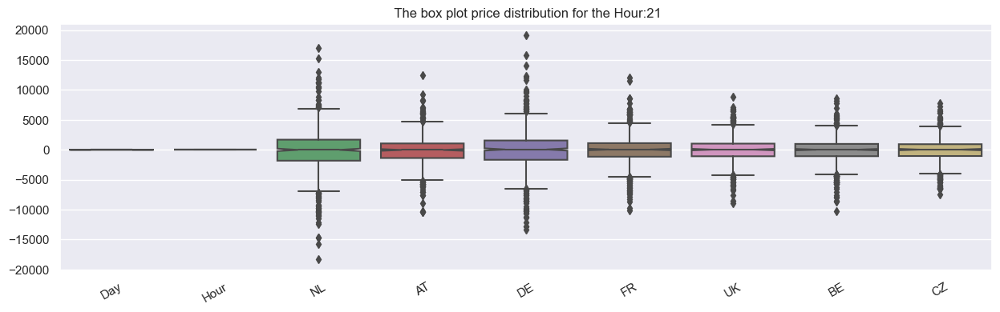

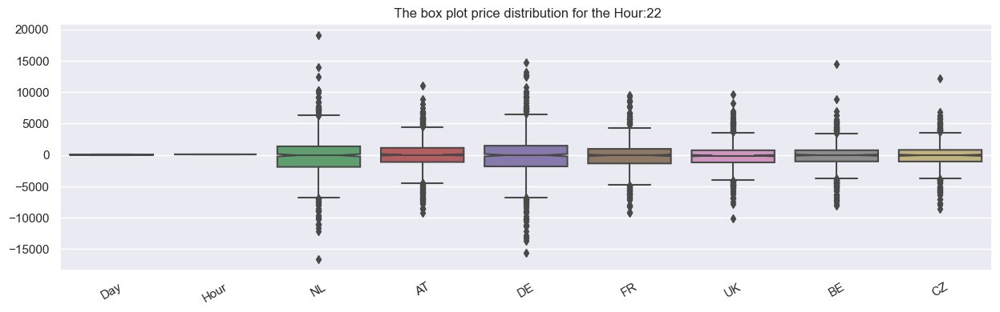

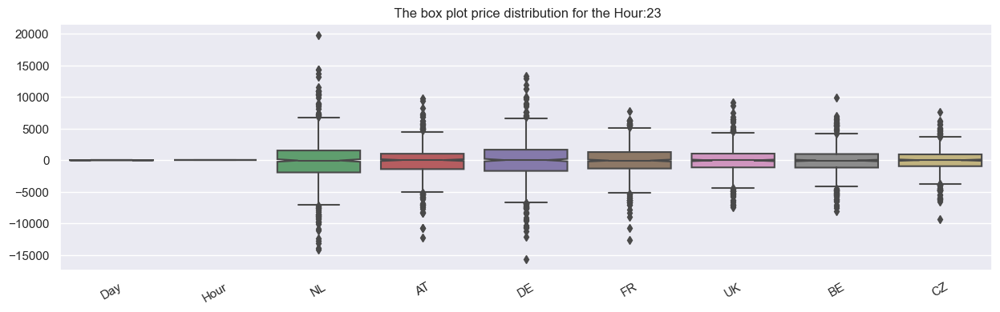

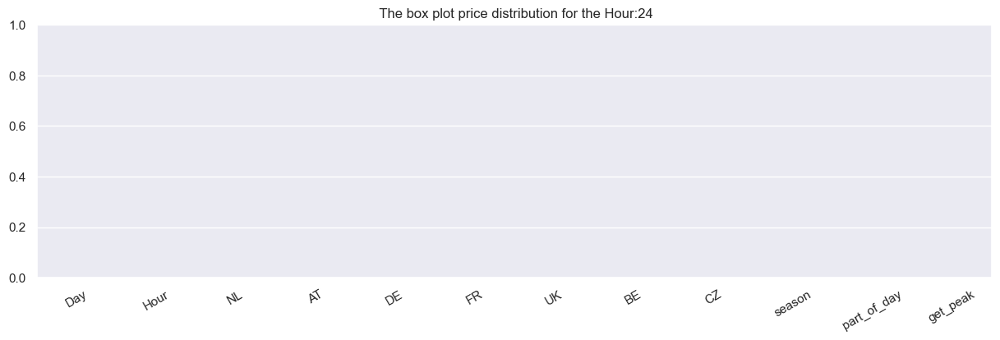

In [59]:
import time
import matplotlib.patches as mpatches
for h in  range(1,25):

    plt.figure()
    sns.set(rc={'figure.figsize':(15,4)})
    ax =sns.boxplot(data=df[df['Hour']==h].iloc[:,2:23],notch = 'True')
    ax.set_xticklabels(ax.get_xticklabels(),rotation=30)
    ax.set_title(' The box plot price distribution for the Hour:'+ str(h))


    
    

In [60]:
def mosthighlycorrelated(mydataframe, numtoreport):
    # find the correlations
    cormatrix = mydataframe.corr()
    # set the correlations on the diagonal or lower triangle to zero,
    # so they will not be reported as the highest ones:
    cormatrix *= np.tri(*cormatrix.values.shape, k=-1).T
    # find the top n correlations
    cormatrix = cormatrix.stack()
    cormatrix = cormatrix.reindex(cormatrix.abs().sort_values(ascending=False).index).reset_index()
    # assign human-friendly names
    cormatrix.columns = ["FirstVariable", "SecondVariable", "Correlation"]
    return cormatrix.head(numtoreport)

In [61]:
X=df2[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK']]

In [62]:
mosthighlycorrelated(X, 21)

,FirstVariable,SecondVariable,Correlation
0,DE,CZ,0.894969
1,BE,CZ,0.865364
2,NL,BE,0.827400
3,AT,DE,0.704930
4,DE,FR,0.704362
5,AT,CZ,0.634236
6,FR,CZ,0.627974
7,FR,UK,0.563494
8,BE,DE,0.550900
9,AT,FR,0.501319


### Standardising Variables
If you want to compare different variables that have different units, are very different variances, it is a good idea to first standardise the variables

In [64]:
#hourly_power_standardized = (hourly_power_cut - hourly_power_cut.mean())/hourly_power_cut.std()
#group by months and stnd across months

In [65]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
standardisedX = scale(X)
standardisedX = pd.DataFrame(standardisedX, index=X.index, columns=X.columns)

In [66]:
standardisedX.apply(np.mean)

NL   -1.530406e-17
BE   -3.374201e-18
AT   -2.272041e-17
DE   -7.168989e-18
FR    3.469249e-18
CZ   -5.902080e-18
UK    2.482335e-18
dtype: float64

In [67]:
standardisedX.apply(np.std)

NL    1.0
BE    1.0
AT    1.0
DE    1.0
FR    1.0
CZ    1.0
UK    1.0
dtype: float64

## Principal Component Analysis
The purpose of principal component analysis is to find the best low-dimensional representation of the variation in a multivariate data set.

To carry out a principal component analysis (PCA) on a multivariate data set, the first step is often to standardise the variables under study using the scale() function

In [68]:
pca = PCA().fit(standardisedX)

In [69]:
def pca_summary(pca, standardised_data, out=True):
    names = ["PC"+str(i) for i in range(1, len(pca.explained_variance_ratio_)+1)]
    a = list(np.std(pca.transform(standardised_data), axis=0))
    b = list(pca.explained_variance_ratio_)
    c = [np.sum(pca.explained_variance_ratio_[:i]) for i in range(1, len(pca.explained_variance_ratio_)+1)]
    columns = pd.MultiIndex.from_tuples([("sdev", "Standard deviation"), ("varprop", "Proportion of Variance"), ("cumprop", "Cumulative Proportion")])
    summary = pd.DataFrame(list(zip(a, b, c)), index=names, columns=columns)
    if out:
        print("Importance of components:")
        display(summary)
    return summary

In [70]:
summary = pca_summary(pca, standardisedX)

Importance of components:


,sdev,varprop,cumprop
,Standard deviation,Proportion of Variance,Cumulative Proportion
PC1,1.970373e+00,5.546243e-01,0.554624
PC2,1.277836e+00,2.332663e-01,0.787891
PC3,8.997158e-01,1.156412e-01,0.903532
PC4,6.316500e-01,5.699739e-02,0.960529
PC5,5.256387e-01,3.947087e-02,1.000000
PC6,2.540807e-16,1.277929e-32,1.000000
PC7,5.226147e-16,2.506470e-33,1.000000


In [71]:
np.sum(summary.sdev**2)

Standard deviation    7.0
dtype: float64

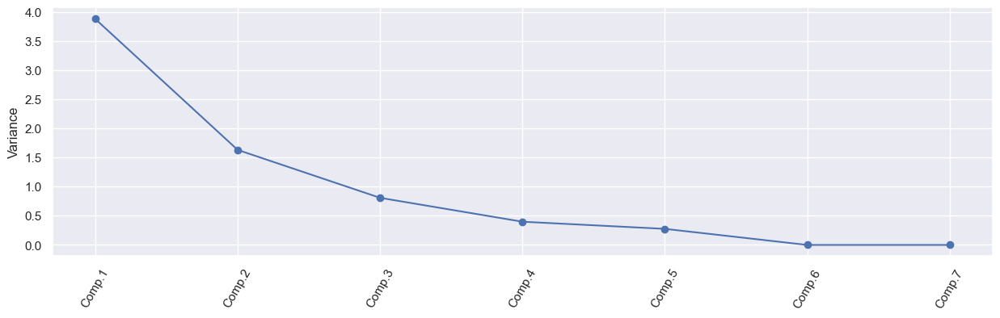

In [72]:
def screeplot(pca, standardised_values):
    y = np.std(pca.transform(standardised_values), axis=0)**2
    x = np.arange(len(y)) + 1
    plt.plot(x, y, "o-")
    plt.xticks(x, ["Comp."+str(i) for i in x], rotation=60)
    plt.ylabel("Variance")
    plt.show()
screeplot(pca, standardisedX)

In [73]:
summary.sdev**2

,Standard deviation
PC1,3.882370e+00
PC2,1.632864e+00
PC3,8.094885e-01
PC4,3.989818e-01
PC5,2.762961e-01
PC6,6.455700e-32
PC7,2.731262e-31


[Text(0, 0, 'NL'),
 Text(1, 0, 'BE'),
 Text(2, 0, 'AT'),
 Text(3, 0, 'DE'),
 Text(4, 0, 'FR'),
 Text(5, 0, 'CZ'),
 Text(6, 0, 'UK')]

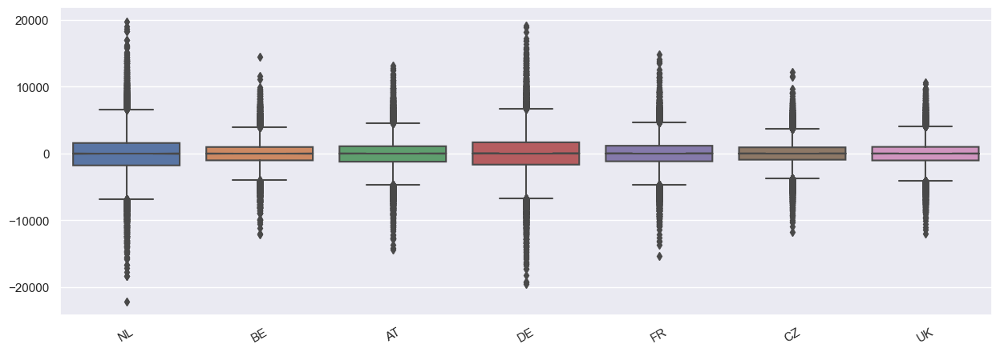

In [74]:
#drawing one figure with title and 3 axes below each other. Size and resolution are specified
sns.set(rc={'figure.figsize':(15,5)})
#drawing boxplots of three different scales, each to separate axis
ax =sns.boxplot(data=df[['NL', 'BE', 'AT', 'DE', 'FR', 'CZ', 'UK']],notch = 'True')


#rotating ticks of the shared x axis by 90 degrees. The shared x axis is located on axes[2]
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

[Text(0, 0, 'NL'),
 Text(1, 0, 'BE'),
 Text(2, 0, 'AT'),
 Text(3, 0, 'DE'),
 Text(4, 0, 'CZ'),
 Text(5, 0, 'UK')]

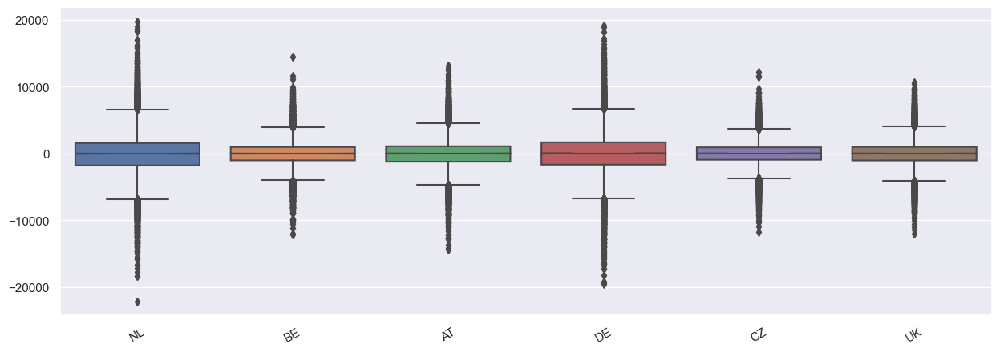

In [75]:
#drawing one figure with title and 3 axes below each other. Size and resolution are specified
sns.set(rc={'figure.figsize':(15,5)})
#drawing boxplots of three different scales, each to separate axis
ax =sns.boxplot(data=df[['NL', 'BE', 'AT', 'DE', 'CZ', 'UK']],notch = 'True')


#rotating ticks of the shared x axis by 90 degrees. The shared x axis is located on axes[2]
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)

[Text(0, 0, 'NL'), Text(1, 0, 'AT'), Text(2, 0, 'DE'), Text(3, 0, 'CZ')]

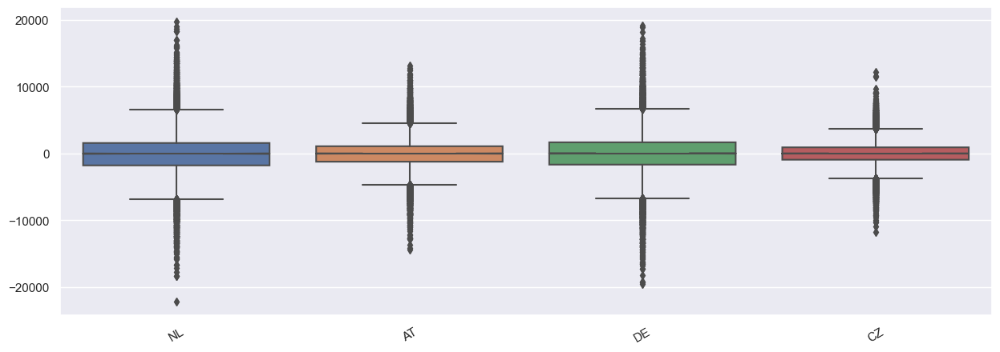

In [76]:
#drawing one figure with title and 3 axes below each other. Size and resolution are specified
sns.set(rc={'figure.figsize':(15,5)})
#drawing boxplots of three different scales, each to separate axis
ax =sns.boxplot(data=df[['NL', 'AT', 'DE', 'CZ']],notch = 'True')


#rotating ticks of the shared x axis by 90 degrees. The shared x axis is located on axes[2]
ax.set_xticklabels(ax.get_xticklabels(),rotation=30)